# Forest Over Type Prediction

## [Data Description](https://www.kaggle.com/c/forest-cover-type-prediction/data)

### Understanding our [tree cover types](https://csfs.colostate.edu/colorado-forests/forest-types/)


1 - [Spruce/Fir](https://csfs.colostate.edu/colorado-forests/forest-types/spruce-fir/): 
Very extensive in Colorado. Usually found at high elevations.   
Species is shade tolerant and tend to quickly repopulate shaded gaps in the forest.   
Very prone to fire, but it takes a very long time (300-400 years) for this type of tree to regenerate (unlike other types).   
Contribution to water supply.   

2 - [Lodgepole Pine](): 
Tolerates wide variety of soil and climate conditions, but does best in gentle slopes and well-drain, acidic, sandy, gravelling loams.    
Intolerant to shade.     
Develops post fire (seeds release under extreme heat).    

3 - [Ponderosa Pine](https://csfs.colostate.edu/colorado-trees/colorados-major-tree-species/):
1829 to 2743 meters (low elevation)    
Drough resistant and significant resource for water supply.   
At interface of wildlife and urban life.   


4 - [Cottonwood/Willow](https://csfs.colostate.edu/media/sites/22/2015/06/Cottonwood_Management_QuickGuide_26June2015.pdf)
Found at lower elevations.   
Eastern side    
Adjacent to rivers and streams.   
1066 - 1981 meters (low elevation)  
Susceptible to high-intensity fire (climate change). Does OK with low-intensity.   
Soil: sandy or silty.   

5 - [Aspen](https://csfs.colostate.edu/colorado-forests/forest-types/aspen/)
Loves sun and does well at higher temperatures.   
Open canopy allows light to reach forest floors.   
Grows well after fires.    
Dryer soils: sandy, gravelly slopes  

6 - [Douglas-fir](https://csfs.colostate.edu/colorado-trees/colorados-major-tree-species/#1466527937174-cd5c5e60-5efc) 
Shade-tolerant   
Rocky, moist soils  
Nothern slopes  
Elevation: 1829 - 2896 meters. 
Susceptible to fire when young, resistent when older.  

7 - [Krummholz](https://coloradobirdingtrail.com/birding-basics/habitats/subalpine-forest/)  
Stunted vegetation due to winds. 
Can only survived when sheltered by rock formations or snow covers  
Higher elevations, subalpine forests. 
Usually this habitat can be accessed in summer, because of snow covering during the rest of the year.  
Unlikely exposed to fire.  
Possibly thin soils.  

## Data Import

In [1]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px 
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.preprocessing import label_binarize
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import Normalizer
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import BernoulliNB
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier 
import xgboost as xgb
import time
from tensorflow.keras.models import Sequential 
from tensorflow.keras.layers import Dense, Activation, Dropout, Flatten
from tensorflow.keras import optimizers
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from sklearn.ensemble import StackingClassifier


#from google.colab import files
import io


%matplotlib inline

In [2]:
def get_Orig_Data_for_ML_Models():
    #train_df = pd.read_csv(io.BytesIO(uploaded_train['train.csv']), index_col='Id')
    train_df = pd.read_csv('input/train.csv', index_col='Id')
    col_names = train_df.columns.tolist()

    print("Column names:")
    print(col_names)

    print("\nSample data:")
    train_df.head()

    # Isolate target data
    cover_type = train_df['Cover_Type']
    y = np.array(cover_type)

    # Dropping output from feature space
    to_drop = ['Cover_Type']
    cover_feat_space = train_df.drop(to_drop, axis = 1)

    # Pull out geatures for future use
    features = cover_feat_space.columns
    X_Orig = np.array(cover_feat_space).astype(np.float)

    y_labels=train_df['Cover_Type']
    y_labels.replace({1:'Spruce/Fir', 2: 'Lodgepole Pine', 3: 'Ponderosa Pine', 4: 'Cottonwood/Willow', 5: 'Aspen', 6: 'Douglas Fir', 7: ' Krummholz'}, inplace=True)

    label_classes = [1,2,3,4,5,6,7]
    y_binarized = label_binarize(y, classes=[1,2,3,4,5,6,7])

    cross_validation = 2
    
    print("Feature space hold %d observations and %d features" % X_Orig.shape)
    print("Unique target labels:", np.unique(y))
    return (train_df, col_names, X_Orig, y, y_labels, y_binarized)

In [3]:
train_df, col_names, X_Orig, y, y_labels, y_binarized = get_Orig_Data_for_ML_Models()

Column names:
['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways', 'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points', 'Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40', 'Cover_Type']

Sample data:
Feature space hold 15120 observations and 54 features
Uniqu

In [4]:
# Assessing missingness
print("There are", np.count_nonzero(np.isnan(X_Orig)), "missing values among our features")
print("There are", np.count_nonzero(np.isnan(y)), "missing values among our target values")

#Assessing plausibility of values
print("\nLooking at summary statistics for our training data:")
train_df.describe()

There are 0 missing values among our features
There are 0 missing values among our target values

Looking at summary statistics for our training data:


,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40
count,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,...,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000
mean,2749.322553,156.676653,16.501587,227.195701,51.076521,1714.023214,212.704299,218.965608,135.091997,1511.147288,...,0.021958,0.045635,0.040741,0.001455,0.006746,0.000661,0.002249,0.048148,0.043452,0.030357
std,417.678187,110.085801,8.453927,210.075296,61.239406,1325.066358,30.561287,22.801966,45.895189,1099.936493,...,0.146550,0.208699,0.197696,0.038118,0.081859,0.025710,0.047368,0.214086,0.203880,0.171574
min,1863.000000,0.000000,0.000000,0.000000,-146.000000,0.000000,0.000000,99.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2376.000000,65.000000,10.000000,67.000000,5.000000,764.000000,196.000000,207.000000,106.000000,730.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2752.000000,126.000000,15.000000,180.000000,32.000000,1316.000000,220.000000,223.000000,138.000000,1256.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,3104.000000,261.000000,22.000000,330.000000,79.000000,2270.000000,235.000000,235.000000,167.000000,1988.250000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,3849.000000,360.000000,52.000000,1343.000000,554.000000,6890.000000,254.000000,254.000000,248.000000,6993.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [5]:
def replace_with_cover_type_desc(data):
    
    data['Cover_Type'].replace({1:'Spruce/Fir', 2: 'Lodgepole Pine', 3: 'Ponderosa Pine', 4: 'Cottonwood/Willow', 5: 'Aspen', 6: 'Douglas Fir', 7: ' Krummholz'}, inplace=True)
    return(data)

In [6]:
train_df = replace_with_cover_type_desc(train_df)

## Exploratory Data Analysis

### Feature Exploration

First, we ensure that each target class is represented fairly in the data set. 

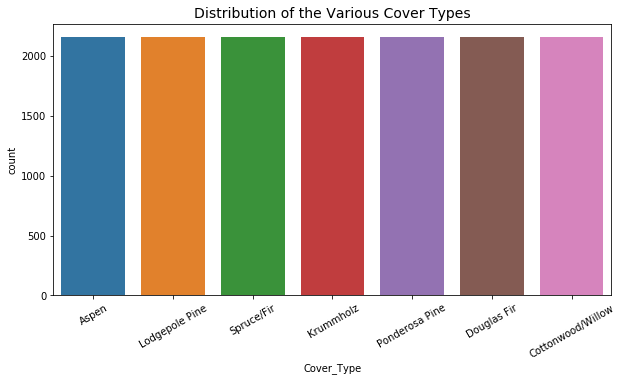

In [7]:
fig, ax = plt.subplots(figsize=(10,5))
ax.set_title("Distribution of the Various Cover Types", size = 14)
ax.set_xticklabels(ax.get_xticklabels(),rotation=30)
ax = sns.countplot(x = "Cover_Type", data = train_df)

From the figure above, it is clear that each target class is equally represented in the data set. Next, we see if any of the features offer distinctions between our Cover Types; starting with our categorical features. 

### Categorical Variables

In [8]:
#Plotting catgorical features
#Transform binary into a few categorical variables, and giving them more meaningful names where possible
def rename_wilderness_area(data):
    data = data.rename(columns={"Wilderness_Area1":"Rawah_WA","Wilderness_Area2":"Neota_WA",
    "Wilderness_Area3":"Comanche_Peak_WA","Wilderness_Area4":"Cache_la_Poudre_WA"})

    data['Wilderness_Areas'] = (data.iloc[:,10:14] == 1).idxmax(1)
    return(data)

train_df = rename_wilderness_area(train_df)

fig = px.histogram(train_df, x="Wilderness_Areas", color="Cover_Type", barmode="group", title='Distribution of Wildreness Area by Cover Type')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [9]:
train_df['Soil_Type'] = (train_df.iloc[:,15:55] == 1).idxmax(1)
fig = px.histogram(train_df, x="Soil_Type", color="Cover_Type", title='Distribution of the Soil Types by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

Each of our categorical feature values appear to provide separation between our target classes. Next let us look at the distributions of our numerical features.

### Continuous Variables

<Figure size 1152x576 with 0 Axes>

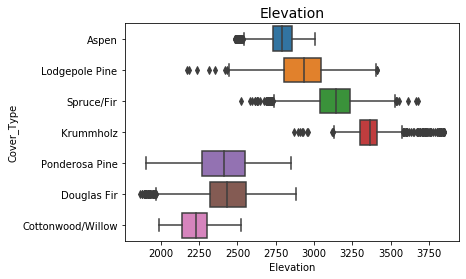

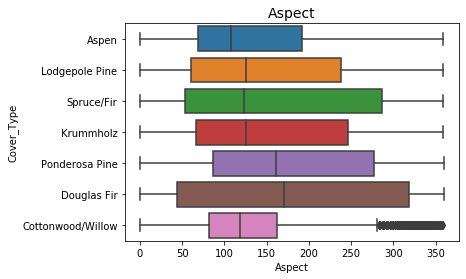

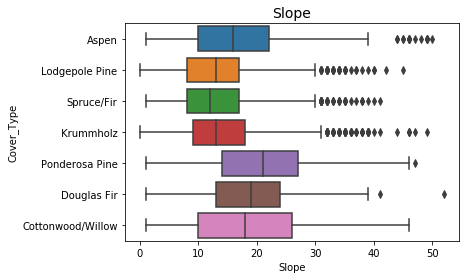

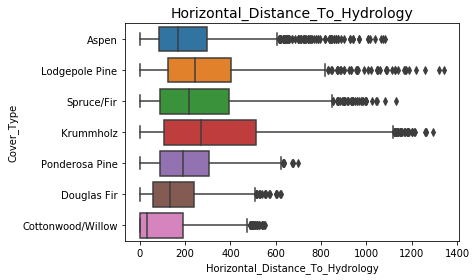

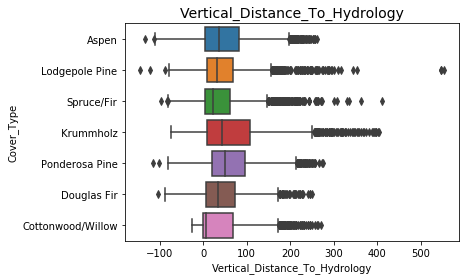

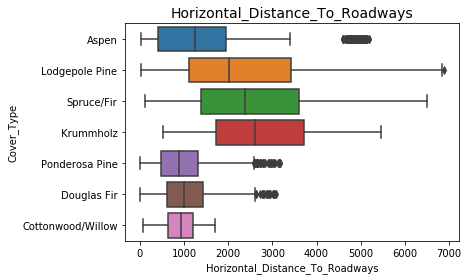

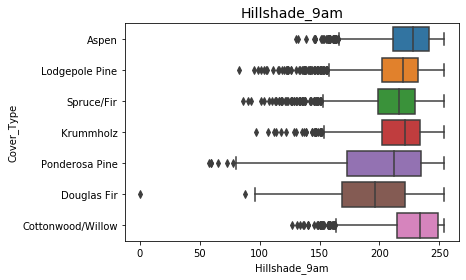

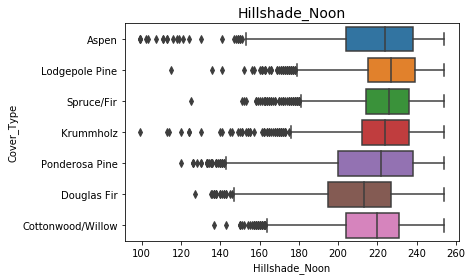

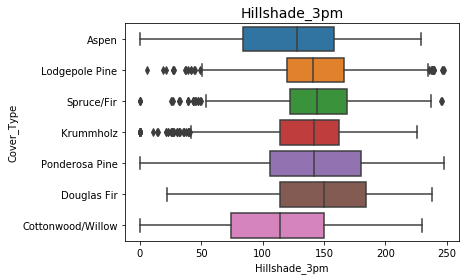

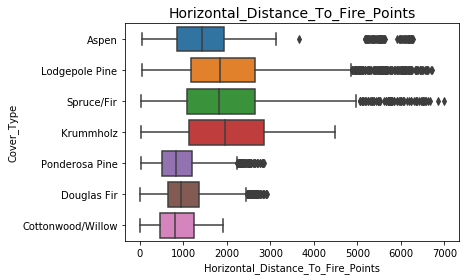

In [10]:
#Plotting and grouping numerical features according to target classes
plt.figure(figsize=(16, 8))

num_values_range = 10
# Iterate over the features, creating a subplot with a histogram for each one.
for feature in range(num_values_range):
    fig1, ax1 = plt.subplots()
    ax1.set_title(train_df.columns[feature], size = 14)
    ax1 = sns.boxplot(x = train_df.columns[feature], y = 'Cover_Type' , data = train_df)

From all the above plots, we do see some separation between features and classes, but we also see significant overlap of the numerical feature distributions. This could cause problems for our predictions depending on the model we select.  
Elevation does appear to show most differentiation between the cover types

In [11]:
fig = px.histogram(train_df, x="Elevation", color="Cover_Type", title= "Distribution of Cover Types")
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

Wilderness also appears to be a differentiating feature and seems linked to other continuous variables

In [12]:
fig = px.histogram(train_df, x="Elevation", color="Wilderness_Areas", title='Distribution of Wilderness Areas by Elevation')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [13]:
fig = px.histogram(train_df, x="Slope", color="Wilderness_Areas", title='Distribution of Wilderness Areas by Slope')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [14]:
fig = px.histogram(train_df, x="Aspect", color="Wilderness_Areas", title='Distribution of Wilderness Areas by Aspect')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

The last feature evaluation step we will take is an look at feature covariance. 

In [15]:
label_classes = [1, 2, 3,4,5,6,7]
y_binarized = label_binarize(y, classes = label_classes)
outcome_df = pd.DataFrame(y_binarized, columns = ['Spruce_Fir','Lodgepole_Pine','Ponderosa Pine','Cottonwood_Willow', 'Aspen','Douglas Fir','Krummholz'])
corr_data = pd.concat([train_df.iloc[:,0:54], outcome_df], axis=1, sort=False)

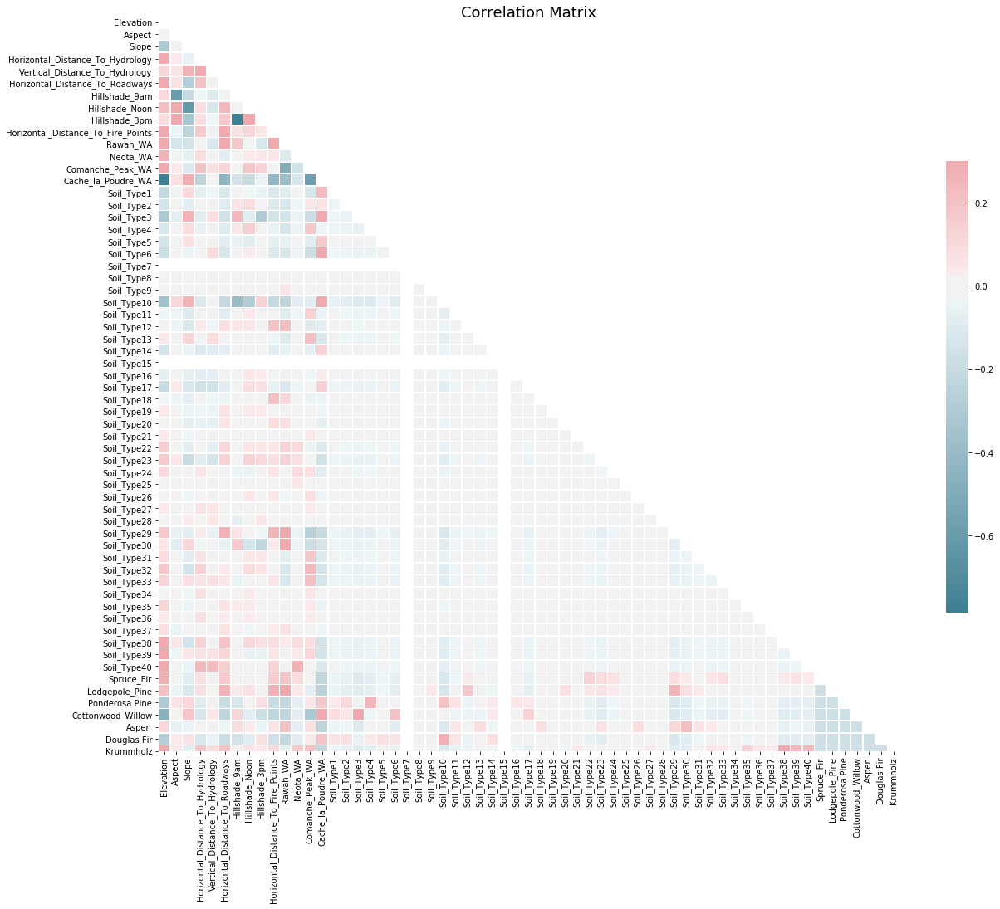

In [16]:
# Compute the correlation matrix 
#corr_data = train_df.copy()
corr = corr_data.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=np.bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 20))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
ax.set_title("Correlation Matrix", size = 18)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

## Feature Engineering

###  [Soils](https://soilseries.sc.egov.usda.gov/osdname.aspx)

Soil is made of sand, silt, clay and organic matter.  

When looking more closely at the description of soil types, we find common elements that can could extracted as additional features. To improve contextual understanding on which soils these forests grow, we extract:
- soil family
- soil complex
- soil rock types (stony, rubbly, bouldery). 
- soil depth
- soil drainage
- whether these soils freeze (indicated by the term "cryo/crya" in the soil type descriptions)
- annual average temperatures (derived from soil family, whose description was provided here: https://soilseries.sc.egov.usda.gov/osdname.aspx)

When nuanced information was provided on intensity of these measures (i.e.: how deep, how much waMissing values were assigned a number of "-1".    
More information is available here: 
https://docs.google.com/spreadsheets/d/1NrDtevQPmZxGge1wOPoCqd7EwuflO4MU4FkZqzPOJJ8/edit?usp=sharing

In [17]:
def add_soil_family(data):
    data['Soil_Family'] = data['Soil_Type'].replace({'Soil_Type1':'Cathedral',
                                                            'Soil_Type2':'Vanet-Ratake',
                                                            'Soil_Type3':'Haploborolis',
                                                            'Soil_Type4':'Ratake',
                                                            'Soil_Type5':'Vanet',
                                                            'Soil_Type6':'Vanet-Wetmore ',
                                                            'Soil_Type7':'Gothic',
                                                            'Soil_Type8':'Supervisor-Limber',
                                                            'Soil_Type9':'Troutville',
                                                            'Soil_Type10':'Bullwark Catamount families',
                                                            'Soil_Type11':'Bullwark Catamount families',
                                                            'Soil_Type12':'Legault family',
                                                            'Soil_Type13':'Catamount Bullwark',
                                                            'Soil_Type14':'Pachic Argiborolis',
                                                            'Soil_Type15':'Soil_Type15',
                                                            'Soil_Type16':'Cryaquolis-Cryoborolis',
                                                            'Soil_Type17':'Gateview',
                                                            'Soil_Type18':'Rogert family',
                                                            'Soil_Type19':'Typic Cryaquolis-Borohemists',
                                                            'Soil_Type20':'Typic Cryaquepts-Typic Cryaquolls',
                                                            'Soil_Type21':'Leighcan family',
                                                            'Soil_Type22':'Leighcan family',
                                                            'Soil_Type23':'Leighcan family',
                                                            'Soil_Type24':'Leighcan family',
                                                            'Soil_Type25':'Leighcan family',
                                                            'Soil_Type26':'Catamount Granile ',
                                                            'Soil_Type27':'Leighcan family',
                                                            'Soil_Type28':'Leighcan family',
                                                            'Soil_Type29':'Como Legault',
                                                            'Soil_Type30':'Como Legault',
                                                            'Soil_Type31':'Leighcan Catamount',
                                                            'Soil_Type32':'Leighcan Catamount',
                                                            'Soil_Type33':'Leighcan Catamount',
                                                            'Soil_Type34':'Cryorthents',
                                                            'Soil_Type35':'Cryumbrepts Cryaquepts',
                                                            'Soil_Type36':'Bross ',
                                                            'Soil_Type37':'Cryumbrepts Cryorthents',
                                                            'Soil_Type38':'Leighcan Moran',
                                                            'Soil_Type39':'Leighcan Moran',
                                                            'Soil_Type40':'Moran'}                                                         
                                                            , inplace=False)
    return(data)

In [18]:
train_df = add_soil_family(train_df)

In [19]:
fig = px.histogram(train_df, x="Soil_Family", color="Cover_Type", title='Distribution of the Soil Families by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [20]:
def add_Soil_Complex(data):
    
    data['Soil_Complex'] = data['Soil_Type'].replace({'Soil_Type1':'Rock outcrop',
                                                    'Soil_Type2':'Unspecified',
                                                    'Soil_Type3':'Rock outcrop',
                                                    'Soil_Type4':'Rock outcrop',
                                                    'Soil_Type5':'Rock outcrop',
                                                    'Soil_Type6':'Rock outcrop',
                                                    'Soil_Type7':'Unspecified',
                                                    'Soil_Type8':'Unspecified',
                                                    'Soil_Type9':'Unspecified',
                                                    'Soil_Type10':'Rock outcrop',
                                                    'Soil_Type11':'Rock land',
                                                    'Soil_Type12':'Rock land',
                                                    'Soil_Type13':'Rock land',
                                                    'Soil_Type14':'Aquolis',
                                                    'Soil_Type15':'Unspecified',
                                                    'Soil_Type16':'Cryaquolis-Cryoborolis',
                                                    'Soil_Type17':'Cryaquolis',
                                                    'Soil_Type18':'Unspecified',
                                                    'Soil_Type19':'Typic Cryaquolis-Borohemists',
                                                    'Soil_Type20':'Typic Cryaquepts-Typic Cryaquolis',
                                                    'Soil_Type21':'Typic Cryaquolis till substratum',
                                                    'Soil_Type22':'Unspecified',
                                                    'Soil_Type23':'Typic Cryaquolis',
                                                    'Soil_Type24':'Unspecified',
                                                    'Soil_Type25':'Unspecified',
                                                    'Soil_Type26':'Unspecified',
                                                    'Soil_Type27':'Rock outcrop',
                                                    'Soil_Type28':'Rock outcrop',
                                                    'Soil_Type29':'Unspecified',
                                                    'Soil_Type30':'Rock land',
                                                    'Soil_Type31':'Unspecified',
                                                    'Soil_Type32':'Rock outcrop',
                                                    'Soil_Type33':'Rock outcrop',
                                                    'Soil_Type34':'Rock land',
                                                    'Soil_Type35':'Rock outcrop',
                                                    'Soil_Type36':'Cryumbrepts  Rock land',
                                                    'Soil_Type37':'Rock outcrop',
                                                    'Soil_Type38':'Cryaquolis',
                                                    'Soil_Type39':'Cryorthents',
                                                    'Soil_Type40':'Cryorthents Rock land '} , inplace=False)
    return(data)
                                                         

In [21]:
train_df = add_Soil_Complex(train_df)

In [22]:
fig = px.histogram(train_df, x="Soil_Complex", color="Cover_Type", title='Distribution of the Soil Complexes by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [23]:
def add_Soil_depth(data):
    
    data['Soil_Depth'] = data['Soil_Type'].replace({'Soil_Type1':'0',
                                                    'Soil_Type2':'0',
                                                    'Soil_Type3':'-1',
                                                    'Soil_Type4':'0',
                                                    'Soil_Type5':'0',
                                                    'Soil_Type6':'0',
                                                    'Soil_Type7':'2',
                                                    'Soil_Type8':'1',
                                                    'Soil_Type9':'2',
                                                    'Soil_Type10':'1',
                                                    'Soil_Type11':'1',
                                                    'Soil_Type12':'0',
                                                    'Soil_Type13':'1',
                                                    'Soil_Type14':'-1',
                                                    'Soil_Type15':'-1',
                                                    'Soil_Type16':'-1',
                                                    'Soil_Type17':'2',
                                                    'Soil_Type18':'0',
                                                    'Soil_Type19':'-1',
                                                    'Soil_Type20':'-1',
                                                    'Soil_Type21':'2',
                                                    'Soil_Type22':'2',
                                                    'Soil_Type23':'2',
                                                    'Soil_Type24':'2',
                                                    'Soil_Type25':'2',
                                                    'Soil_Type26':'1',
                                                    'Soil_Type27':'2',
                                                    'Soil_Type28':'2',
                                                    'Soil_Type29':'1',
                                                    'Soil_Type30':'2',
                                                    'Soil_Type31':'2',
                                                    'Soil_Type32':'1',
                                                    'Soil_Type33':'1',
                                                    'Soil_Type34':'-1',
                                                    'Soil_Type35':'-1',
                                                    'Soil_Type36':'2',
                                                    'Soil_Type37':'-1',
                                                    'Soil_Type38':'2',
                                                    'Soil_Type39':'2',
                                                    'Soil_Type40':'2',} , inplace=False)
    return(data)

In [24]:
train_df = add_Soil_depth(train_df)

In [25]:
fig = px.histogram(train_df, x="Soil_Depth", color="Cover_Type", title='Distribution of the Soil Depths by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [26]:
def add_Soil_Stony(data):
    
    data['Soil_Stony'] = data['Soil_Type'].replace({'Soil_Type1':'3',
                                                    'Soil_Type2':'2',
                                                    'Soil_Type3':'0',
                                                    'Soil_Type4':'0',
                                                    'Soil_Type5':'0',
                                                    'Soil_Type6':'1',
                                                    'Soil_Type7':'0',
                                                    'Soil_Type8':'0',
                                                    'Soil_Type9':'2',
                                                    'Soil_Type10':'0',
                                                    'Soil_Type11':'0',
                                                    'Soil_Type12':'1',
                                                    'Soil_Type13':'0',
                                                    'Soil_Type14':'0',
                                                    'Soil_Type15':'0',
                                                    'Soil_Type16':'0',
                                                    'Soil_Type17':'0',
                                                    'Soil_Type18':'2',
                                                    'Soil_Type19':'0',
                                                    'Soil_Type20':'0',
                                                    'Soil_Type21':'0',
                                                    'Soil_Type22':'0',
                                                    'Soil_Type23':'0',
                                                    'Soil_Type24':'3',
                                                    'Soil_Type25':'3',
                                                    'Soil_Type26':'2',
                                                    'Soil_Type27':'3',
                                                    'Soil_Type28':'3',
                                                    'Soil_Type29':'3',
                                                    'Soil_Type30':'3',
                                                    'Soil_Type31':'3',
                                                    'Soil_Type32':'3',
                                                    'Soil_Type33':'3',
                                                    'Soil_Type34':'3',
                                                    'Soil_Type35':'0',
                                                    'Soil_Type36':'3',
                                                    'Soil_Type37':'3',
                                                    'Soil_Type38':'3',
                                                    'Soil_Type39':'3',
                                                    'Soil_Type40':'3'} , inplace=False)
    return(data)

In [27]:
train_df = add_Soil_Stony(train_df)

In [28]:
fig = px.histogram(train_df, x="Soil_Stony", color="Cover_Type", title='Distribution of the Soil Stone Types by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [29]:
def add_Soil_Rubbly(data):
    
    data['Soil_Rubbly'] = data['Soil_Type'].replace({'Soil_Type1':'0',
                                                    'Soil_Type2':'0',
                                                    'Soil_Type3':'1',
                                                    'Soil_Type4':'1',
                                                    'Soil_Type5':'1',
                                                    'Soil_Type6':'0',
                                                    'Soil_Type7':'0',
                                                    'Soil_Type8':'0',
                                                    'Soil_Type9':'0',
                                                    'Soil_Type10':'1',
                                                    'Soil_Type11':'1',
                                                    'Soil_Type12':'0',
                                                    'Soil_Type13':'1',
                                                    'Soil_Type14':'0',
                                                    'Soil_Type15':'0',
                                                    'Soil_Type16':'0',
                                                    'Soil_Type17':'0',
                                                    'Soil_Type18':'0',
                                                    'Soil_Type19':'0',
                                                    'Soil_Type20':'0',
                                                    'Soil_Type21':'0',
                                                    'Soil_Type22':'0',
                                                    'Soil_Type23':'0',
                                                    'Soil_Type24':'0',
                                                    'Soil_Type25':'0',
                                                    'Soil_Type26':'0',
                                                    'Soil_Type27':'0',
                                                    'Soil_Type28':'0',
                                                    'Soil_Type29':'0',
                                                    'Soil_Type30':'0',
                                                    'Soil_Type31':'0',
                                                    'Soil_Type32':'0',
                                                    'Soil_Type33':'0',
                                                    'Soil_Type34':'0',
                                                    'Soil_Type35':'0',
                                                    'Soil_Type36':'0',
                                                    'Soil_Type37':'0',
                                                    'Soil_Type38':'0',
                                                    'Soil_Type39':'0',
                                                    'Soil_Type40':'0'} , inplace=False)
    return(data)


In [30]:
train_df = add_Soil_Rubbly(train_df)

In [31]:
fig = px.histogram(train_df, x="Soil_Rubbly", color="Cover_Type", title='Distribution of the Soil Rubble Types by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [32]:
def add_Soil_Bouldery(data):
    
    data['Soil_Bouldery'] = data['Soil_Type'].replace({'Soil_Type1':'0',
                                                        'Soil_Type2':'0',
                                                        'Soil_Type3':'0',
                                                        'Soil_Type4':'0',
                                                        'Soil_Type5':'0',
                                                        'Soil_Type6':'0',
                                                        'Soil_Type7':'0',
                                                        'Soil_Type8':'0',
                                                        'Soil_Type9':'0',
                                                        'Soil_Type10':'0',
                                                        'Soil_Type11':'0',
                                                        'Soil_Type12':'0',
                                                        'Soil_Type13':'0',
                                                        'Soil_Type14':'0',
                                                        'Soil_Type15':'0',
                                                        'Soil_Type16':'0',
                                                        'Soil_Type17':'0',
                                                        'Soil_Type18':'0',
                                                        'Soil_Type19':'0',
                                                        'Soil_Type20':'0',
                                                        'Soil_Type21':'0',
                                                        'Soil_Type22':'1',
                                                        'Soil_Type23':'0',
                                                        'Soil_Type24':'0',
                                                        'Soil_Type25':'0',
                                                        'Soil_Type26':'0',
                                                        'Soil_Type27':'0',
                                                        'Soil_Type28':'0',
                                                        'Soil_Type29':'0',
                                                        'Soil_Type30':'0',
                                                        'Soil_Type31':'0',
                                                        'Soil_Type32':'0',
                                                        'Soil_Type33':'0',
                                                        'Soil_Type34':'0',
                                                        'Soil_Type35':'0',
                                                        'Soil_Type36':'0',
                                                        'Soil_Type37':'0',
                                                        'Soil_Type38':'0',
                                                        'Soil_Type39':'0',
                                                        'Soil_Type40':'0'} , inplace=False)
    return(data)

In [33]:
train_df = add_Soil_Bouldery(train_df)

In [34]:
fig = px.histogram(train_df, x="Soil_Bouldery", color="Cover_Type", title='Distribution of the Soil Boulder Types by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [35]:
def add_Soil_Freezing(data):
    
    data['Soil_Freezing'] = data['Soil_Type'].replace({'Soil_Type1':'0',
                                                        'Soil_Type2':'0',
                                                        'Soil_Type3':'0',
                                                        'Soil_Type4':'0',
                                                        'Soil_Type5':'0',
                                                        'Soil_Type6':'0',
                                                        'Soil_Type7':'0',
                                                        'Soil_Type8':'0',
                                                        'Soil_Type9':'0',
                                                        'Soil_Type10':'0',
                                                        'Soil_Type11':'0',
                                                        'Soil_Type12':'0',
                                                        'Soil_Type13':'0',
                                                        'Soil_Type14':'0',
                                                        'Soil_Type15':'0',
                                                        'Soil_Type16':'1',
                                                        'Soil_Type17':'1',
                                                        'Soil_Type18':'0',
                                                        'Soil_Type19':'1',
                                                        'Soil_Type20':'1',
                                                        'Soil_Type21':'1',
                                                        'Soil_Type22':'0',
                                                        'Soil_Type23':'1',
                                                        'Soil_Type24':'0',
                                                        'Soil_Type25':'0',
                                                        'Soil_Type26':'0',
                                                        'Soil_Type27':'0',
                                                        'Soil_Type28':'0',
                                                        'Soil_Type29':'0',
                                                        'Soil_Type30':'0',
                                                        'Soil_Type31':'0',
                                                        'Soil_Type32':'0',
                                                        'Soil_Type33':'0',
                                                        'Soil_Type34':'0',
                                                        'Soil_Type35':'0',
                                                        'Soil_Type36':'1',
                                                        'Soil_Type37':'0',
                                                        'Soil_Type38':'1',
                                                        'Soil_Type39':'1',
                                                        'Soil_Type40':'1'} , inplace=False)
    return(data)

In [36]:
train_df = add_Soil_Freezing(train_df)

In [37]:
fig = px.histogram(train_df, x="Soil_Freezing", color="Cover_Type", title='Distribution of the Soil Freeze Types by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [38]:
def add_Soil_Drainage (data):
    
    data['Soil_Drainage'] = data['Soil_Type'].replace({'Soil_Type1':'3',
                                                    'Soil_Type2':'2',
                                                    'Soil_Type3':'-1',
                                                    'Soil_Type4':'2',
                                                    'Soil_Type5':'2',
                                                    'Soil_Type6':'2',
                                                    'Soil_Type7':'2',
                                                    'Soil_Type8':'2',
                                                    'Soil_Type9':'2',
                                                    'Soil_Type10':'3',
                                                    'Soil_Type11':'3',
                                                    'Soil_Type12':'3',
                                                    'Soil_Type13':'3',
                                                    'Soil_Type14':'-1',
                                                    'Soil_Type15':'-1',
                                                    'Soil_Type16':'-1',
                                                    'Soil_Type17':'3',
                                                    'Soil_Type18':'2',
                                                    'Soil_Type19':'-1',
                                                    'Soil_Type20':'-1',
                                                    'Soil_Type21':'3',
                                                    'Soil_Type22':'2',
                                                    'Soil_Type23':'2',
                                                    'Soil_Type24':'2',
                                                    'Soil_Type25':'2',
                                                    'Soil_Type26':'2',
                                                    'Soil_Type27':'2',
                                                    'Soil_Type28':'2',
                                                    'Soil_Type29':'3',
                                                    'Soil_Type30':'3',
                                                    'Soil_Type31':'2',
                                                    'Soil_Type32':'3',
                                                    'Soil_Type33':'3',
                                                    'Soil_Type34':'-1',
                                                    'Soil_Type35':'-1',
                                                    'Soil_Type36':'2',
                                                    'Soil_Type37':'-1',
                                                    'Soil_Type38':'2',
                                                    'Soil_Type39':'2',
                                                    'Soil_Type40':'2'} , inplace=False)
    return(data)


In [39]:
train_df = add_Soil_Drainage(train_df)

In [40]:
fig = px.histogram(train_df, x="Soil_Drainage", color="Cover_Type", title='Distribution of the Soil Drain Types by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [41]:
def add_Soil_Annual_Temp_Range (data):
    
    data['Soil_Annual_Temp_Range'] = data['Soil_Type'].replace({'Soil_Type1':40,
                                                                'Soil_Type2':40,
                                                                'Soil_Type3':-1,
                                                                'Soil_Type4':40,
                                                                'Soil_Type5':40,
                                                                'Soil_Type6':40,
                                                                'Soil_Type7':30,
                                                                'Soil_Type8':40,
                                                                'Soil_Type9':30,
                                                                'Soil_Type10':40,
                                                                'Soil_Type11':40,
                                                                'Soil_Type12':40,
                                                                'Soil_Type13':40,
                                                                'Soil_Type14':-1,
                                                                'Soil_Type15':-1,
                                                                'Soil_Type16':-1,
                                                                'Soil_Type17':30,
                                                                'Soil_Type18':30,
                                                                'Soil_Type19':-1,
                                                                'Soil_Type20':-1,
                                                                'Soil_Type21':30,
                                                                'Soil_Type22':30,
                                                                'Soil_Type23':30,
                                                                'Soil_Type24':30,
                                                                'Soil_Type25':30,
                                                                'Soil_Type26':30,
                                                                'Soil_Type27':30,
                                                                'Soil_Type28':30,
                                                                'Soil_Type29':30,
                                                                'Soil_Type30':30,
                                                                'Soil_Type31':30,
                                                                'Soil_Type32':30,
                                                                'Soil_Type33':30,
                                                                'Soil_Type34':-1,
                                                                'Soil_Type35':-1,
                                                                'Soil_Type36':20,
                                                                'Soil_Type37':-1,
                                                                'Soil_Type38':30,
                                                                'Soil_Type39':30,
                                                                'Soil_Type40':30} , inplace=False)
    return(data)

In [42]:
train_df = add_Soil_Annual_Temp_Range(train_df)

In [43]:
fig = px.histogram(train_df, x="Soil_Annual_Temp_Range", color="Cover_Type", title='Distribution of the Soil Annual Temperature Range by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

#### Quality assessment of new soil features
#### Elevation and Soil features. 

We can test our assumptions on these new features by comparing them with what we know about elevation. For example, we can test whether soil complexes that have the term "cryo/crya" tend to be at higher elevtations. 

In [44]:
df = px.data.tips()
fig = px.box(train_df, x="Soil_Complex", y="Elevation")
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [45]:
df = px.data.tips()
fig = px.box(train_df, x="Soil_Annual_Temp_Range", y="Elevation")
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

Similary, for forests that grow at higher elevations, we expect more bouldery, stony soils. 

In [46]:
df = px.data.tips()
fig = px.box(train_df, x="Soil_Stony", y="Elevation")
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [47]:
df = px.data.tips()
fig = px.box(train_df, x="Soil_Rubbly", y="Elevation")
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [48]:
df = px.data.tips()
fig = px.box(train_df, x="Soil_Bouldery", y="Elevation")
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

### Hillshade

Based on our forest cover type descritions aove, we speculate that some types of trees are susceptible to grow with a lot of light (i.e.: lodgepole pine). 

In [49]:
def light_binary(row):
    if (row['Hillshade_9am'] >150) &  (row['Hillshade_Noon'] >150) & (row['Hillshade_3pm'] >150):
        return 1
    return 0

In [50]:
def add_light(data):
    data['Light'] = data.apply(lambda row: light_binary(row), axis=1)
    return(data)

In [51]:
train_df = add_light(train_df)

In [52]:
train_df['Light'].value_counts()

0    9996
1    5124
Name: Light, dtype: int64

In [53]:
fig = px.histogram(train_df, x="Light", color="Cover_Type", title='Distribution of the Soil Drain Types by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

This feature does not show a lot of differentiation, but the amount of light at 9am, 12pm and 3pm during the summer solstice may be more homogeneous.  

### Distance Features

There are several additional features to extract from distance measures:
- Vertical and horizontal distance to hydrology can be combined to generate the Euclidean distance
- Horizontal distances to key points such as Fire and Hydrology can be combined (added or substracted) to measure how far appeart they are from each other, with respect to a tree cover area. 
- Simiarly, vertical distances, such as distance to hydrology and elevation can be combiend (added or substracted) to identify the relative distance of between a cover area and hydrology. 

In [54]:
def add_more_features(data):   
    data['Ele_minus_VDtHyd'] = data.Elevation-data.Vertical_Distance_To_Hydrology
    data['Ele_plus_VDtHyd'] = data.Elevation+data.Vertical_Distance_To_Hydrology
    data['Distance_to_Hydrology'] = (data['Horizontal_Distance_To_Hydrology']**2+data['Vertical_Distance_To_Hydrology']**2)**0.5
    data['Hydro_plus_Fire'] = data['Horizontal_Distance_To_Hydrology']+data['Horizontal_Distance_To_Fire_Points']
    data['Hydro_minus_Fire'] = data['Horizontal_Distance_To_Hydrology']-data['Horizontal_Distance_To_Fire_Points']
    data['Hydro_plus_Road'] = data['Horizontal_Distance_To_Hydrology']+data['Horizontal_Distance_To_Roadways']
    data['Hydro_minus_Road'] = data['Horizontal_Distance_To_Hydrology']-data['Horizontal_Distance_To_Roadways']
    data['Fire_plus_Road'] = data['Horizontal_Distance_To_Fire_Points']+data['Horizontal_Distance_To_Roadways']
    data['Fire_minus_Road'] = data['Horizontal_Distance_To_Fire_Points']-data['Horizontal_Distance_To_Roadways']
    data['Soil_Type_agg'] = (data.iloc[:,15:55] == 1).idxmax(1).str.extract('(\D+)(\d+)', expand=False)[1]
    return data

In [55]:
train_df = add_more_features(train_df)

In [56]:
train_df.columns

Index(['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points', 'Rawah_WA', 'Neota_WA',
       'Comanche_Peak_WA', 'Cache_la_Poudre_WA', 'Soil_Type1', 'Soil_Type2',
       'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7',
       'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12',
       'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16',
       'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20',
       'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24',
       'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28',
       'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32',
       'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36',
       'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40',
       'Cover_Type

## Enhanced Dataset

From our exploration, we generate a new dataset with enchanced features

In [57]:
def prepare_for_ML_Program(data, test=False):

    if test:
        data_new = data[['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
               'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
               'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
               'Horizontal_Distance_To_Fire_Points', 'Rawah_WA', 'Neota_WA',
               'Comanche_Peak_WA', 'Cache_la_Poudre_WA',
               'Soil_Depth', 'Soil_Stony', 'Soil_Rubbly', 'Soil_Bouldery',
               'Soil_Freezing','Soil_Drainage', 'Soil_Annual_Temp_Range',
               'Light', 'Ele_minus_VDtHyd', 'Ele_plus_VDtHyd',
               'Distance_to_Hydrology', 'Hydro_plus_Fire', 'Hydro_minus_Fire',
               'Hydro_plus_Road', 'Hydro_minus_Road', 'Fire_plus_Road',
               'Fire_minus_Road', 'Soil_Type1', 'Soil_Type2',
               'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7',
               'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12',
               'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16',
               'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20',
               'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24',
               'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28',
               'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32',
               'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36',
               'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40']]
    
    else:
        data_new = data[['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
               'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
               'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
               'Horizontal_Distance_To_Fire_Points', 'Rawah_WA', 'Neota_WA',
               'Comanche_Peak_WA', 'Cache_la_Poudre_WA',
               'Soil_Depth', 'Soil_Stony', 'Soil_Rubbly', 'Soil_Bouldery',
               'Soil_Freezing','Soil_Drainage', 'Soil_Annual_Temp_Range',
               'Light', 'Ele_minus_VDtHyd', 'Ele_plus_VDtHyd',
               'Distance_to_Hydrology', 'Hydro_plus_Fire', 'Hydro_minus_Fire',
               'Hydro_plus_Road', 'Hydro_minus_Road', 'Fire_plus_Road',
               'Fire_minus_Road', 'Soil_Type1', 'Soil_Type2',
               'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7',
               'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12',
               'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16',
               'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20',
               'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24',
               'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28',
               'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32',
               'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36',
               'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40','Cover_Type']]
        
        
    dummy = pd.get_dummies(data['Soil_Family'])
    data_new = pd.concat([data_new, dummy], axis =1)
    dummy = pd.get_dummies(data['Soil_Complex'])
    data_new = pd.concat([data_new, dummy], axis =1)
    return(data_new)

In [58]:
train_new = prepare_for_ML_Program(train_df)

In [59]:
list(train_new.columns)

['Elevation',
 'Aspect',
 'Slope',
 'Horizontal_Distance_To_Hydrology',
 'Vertical_Distance_To_Hydrology',
 'Horizontal_Distance_To_Roadways',
 'Hillshade_9am',
 'Hillshade_Noon',
 'Hillshade_3pm',
 'Horizontal_Distance_To_Fire_Points',
 'Rawah_WA',
 'Neota_WA',
 'Comanche_Peak_WA',
 'Cache_la_Poudre_WA',
 'Soil_Depth',
 'Soil_Stony',
 'Soil_Rubbly',
 'Soil_Bouldery',
 'Soil_Freezing',
 'Soil_Drainage',
 'Soil_Annual_Temp_Range',
 'Light',
 'Ele_minus_VDtHyd',
 'Ele_plus_VDtHyd',
 'Distance_to_Hydrology',
 'Hydro_plus_Fire',
 'Hydro_minus_Fire',
 'Hydro_plus_Road',
 'Hydro_minus_Road',
 'Fire_plus_Road',
 'Fire_minus_Road',
 'Soil_Type1',
 'Soil_Type2',
 'Soil_Type3',
 'Soil_Type4',
 'Soil_Type5',
 'Soil_Type6',
 'Soil_Type7',
 'Soil_Type8',
 'Soil_Type9',
 'Soil_Type10',
 'Soil_Type11',
 'Soil_Type12',
 'Soil_Type13',
 'Soil_Type14',
 'Soil_Type15',
 'Soil_Type16',
 'Soil_Type17',
 'Soil_Type18',
 'Soil_Type19',
 'Soil_Type20',
 'Soil_Type21',
 'Soil_Type22',
 'Soil_Type23',
 'Soil_Ty

## Baseline Model

The model we have selected to start with as our baseline is K-Nearest Neighbors. The KNN was selected as a starting model, not only because it is computationally the simplest model to start from, but also our features represent geographical position and therefore, agriculturally, it makes sense that a tree would be the same species as their physically nearby neighbor.
We tested different number of neighbors and tested weighting our features. Below, we are displaying the model with best accuracy. 

In [60]:
class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

In [61]:
def display_CrossValidation_class_level_charts(y_true, y_predict, label_classes):
# ################################################################################
# This function is implemented to display each class level Cross Validation chart
# y_true: Truth data given for lable
# y_predict:  Predicted labels from Machine learning models
# label_Classes: All the labels_class we are trying to predict
# #################################################################################
    fig = plt.figure(figsize=(14,12))
    plt.tight_layout()

    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    lw = 2

    for i in range(len(label_classes)):
        fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_predict[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        sp = fig.add_subplot(3, 3, i+1)
        sp.set_title('cover_class ' + str( label_classes[i]))
        plt.plot(fpr[i], tpr[i], color='darkorange',
                 lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[i])
        plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.legend(loc="lower right")

    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.5)
    plt.show() 

def ml_pipleline(ml_name, model, X,y, binarize = False,    detailedCVcharts = False):

    label_classes=[1,2,3,4,5,6,7]
    y_binarized = label_binarize(y,classes=[1,2,3,4,5,6,7])
    
    X_train, X_valid, y_train, y_valid = train_test_split(
            X, y, test_size=0.3, random_state=17)
    
    ml_pipe = Pipeline([('scaler', StandardScaler()), 
                           (ml_name, model)]) 

    ml_pipe.fit(X_train, y_train)

    y_train_predict = ml_pipe.predict(X_train)
    train_report = classification_report(y_train, y_train_predict)
    print('Training Set - Classication report metrics: \n ', train_report)
    
    
    y_predict = ml_pipe.predict(X_valid)
    report = classification_report( y_valid, y_predict)
  
    print(color.BOLD, ml_name, color.END, '\n')
    print('Validation Set - Classication report metrics: \n ', report)

    cv_scores = cross_val_score(model, X, y, cv=cross_validation)
    
#     print('Cross Validation Scores:', cv_scores)
    print('\n Cross Validation Average Score', round(np.mean(cv_scores),3))
    

    if detailedCVcharts:
        display_CrossValidation_class_level_charts(y_valid, y_predict,label_classes)
        
    return(report, y_predict, y_valid)


def display_confusion_matrix(y_valid, y_predict):
    print(color.BOLD + "Confusion Matrix" + color.END + "\n")
    mat = confusion_matrix(y_valid, y_predict)
    plt.figure(figsize=(10,10))
    sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,
                xticklabels=np.unique(y_labels),
                yticklabels=np.unique(y_labels))
    plt.xlabel('True Label')
    plt.ylabel('Predicted Label')
    plt.show()

def get_ML_data_after_feature_engineering(data):

    # Dropping output from feature space
    to_drop = ['Cover_Type']
    cover_feat_space = data.drop(to_drop, axis = 1)

    # Pull out geatures for future use
    features = cover_feat_space.columns
    X_feature_engineered = np.array(cover_feat_space).astype(np.float)
    return(X_feature_engineered)
    

X_feature_engineered = get_ML_data_after_feature_engineering(train_new)

Training Set - Classication report metrics: 
                precision    recall  f1-score   support

           1       1.00      1.00      1.00      1525
           2       1.00      1.00      1.00      1505
           3       1.00      1.00      1.00      1491
           4       1.00      1.00      1.00      1512
           5       1.00      1.00      1.00      1540
           6       1.00      1.00      1.00      1525
           7       1.00      1.00      1.00      1486

    accuracy                           1.00     10584
   macro avg       1.00      1.00      1.00     10584
weighted avg       1.00      1.00      1.00     10584

 KNN with 1  Neighbors  

Validation Set - Classication report metrics: 
                precision    recall  f1-score   support

           1       0.70      0.65      0.68       635
           2       0.69      0.60      0.64       655
           3       0.79      0.67      0.73       669
           4       0.87      0.94      0.90       648
          

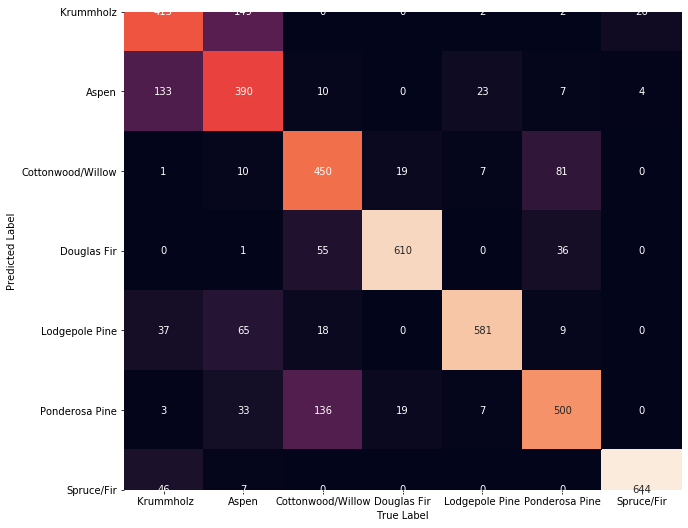

In [62]:
# KNN Neighborhood with weights = uniform
#knn_values = [1,3,5,7,9]
knn_values = [1]
for value in knn_values:
    knn_classifier = KNeighborsClassifier(n_neighbors=value)
    report, y_predict , y_valid= ml_pipleline('KNN with '+ str(value) +'  Neighbors', knn_classifier, \
                                      X_Orig, y, binarize = False, detailedCVcharts = False )
display_confusion_matrix (y_valid, y_predict)

Our confusion matrix indicates that, in all kNN models shown above, Kurmmholz and Aspen forest types get most often confused. In addition, it indicates that the accuracy of predictions is slightly inbalanced (Cottonwood gets most often mispredicted as Ponderosa Pine, but Ponderosa Pine does not get mispredicted as often for Cottonwood). Based on our readings, this may indicate that a distance measure may not be the most appropriate metric for our prediction model.   
Without further context for this problem, we define our main evaluation metric to be **accuracy**. 

## Enhanced Baseline Model

#### With enhanced features

Training Set - Classication report metrics: 
                precision    recall  f1-score   support

           1       1.00      1.00      1.00      1525
           2       1.00      1.00      1.00      1505
           3       1.00      1.00      1.00      1491
           4       1.00      1.00      1.00      1512
           5       1.00      1.00      1.00      1540
           6       1.00      1.00      1.00      1525
           7       1.00      1.00      1.00      1486

    accuracy                           1.00     10584
   macro avg       1.00      1.00      1.00     10584
weighted avg       1.00      1.00      1.00     10584

 KNN with 1  Neighbors - Enhanced  

Validation Set - Classication report metrics: 
                precision    recall  f1-score   support

           1       0.72      0.70      0.71       635
           2       0.71      0.62      0.67       655
           3       0.85      0.74      0.79       669
           4       0.89      0.96      0.92       648

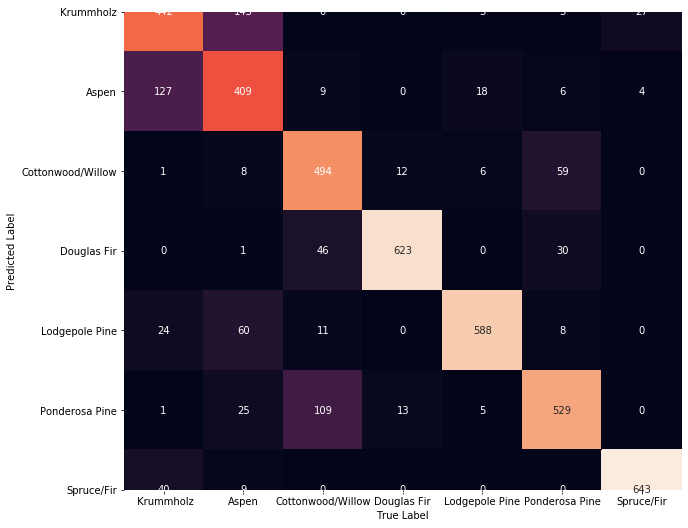

In [63]:
# KNN Neighborhood with weights = uniform
#knn_values = [1,3,5,7,9]
knn_values = [1]
for value in knn_values:
    knn_classifier = KNeighborsClassifier(n_neighbors=value)
    report, y_predict , y_valid= ml_pipleline('KNN with '+ str(value) +'  Neighbors - Enhanced', knn_classifier, \
                                      X_feature_engineered, y, binarize = False, detailedCVcharts = False )
display_confusion_matrix (y_valid, y_predict)

Our enhanced dataset did not improve performance for kNN. 

*Note: While we are only displaying below our models with highest accuracies, we have in fact tested others that did not result in great performance https://docs.google.com/spreadsheets/d/1eWCVlobr35lv0JADglACRm77WFw1kGes8KG4DUChTTA/edit#gid=0*

## Random Forest

Implemented GridSearch to find the model with most optimized parameters. 

In [64]:
#rf_parameters = [{'n_estimators': [100, 300, 500],   
#                   'criterion': ["gini", "entropy"],  
#                   'max_depth':  [50, 100, 1000, None],  
#                   'bootstrap': [True],  
#                   'oob_score': [True, False],   
#                   'random_state': [17]   
#                  
#                  }] 

              
#rf = GridSearchCV(RandomForestClassifier(), rf_parameters, cv=5, verbose=2)
#rf.fit(X_train, y_train)    
#rf.best_params_
#means=rf.cv_results_['mean_test_score']  
#stds=rf.cv_results_['std_test_score']  

#print(rf.best_params_)
#print(means)
#print(stds)

The model which produced highest accuracy was then implemented subsequently

#### With our original data

Training Set - Classication report metrics: 
                precision    recall  f1-score   support

           1       1.00      1.00      1.00      1525
           2       1.00      1.00      1.00      1505
           3       1.00      1.00      1.00      1491
           4       1.00      1.00      1.00      1512
           5       1.00      1.00      1.00      1540
           6       1.00      1.00      1.00      1525
           7       1.00      1.00      1.00      1486

    accuracy                           1.00     10584
   macro avg       1.00      1.00      1.00     10584
weighted avg       1.00      1.00      1.00     10584

 Random Forest  

Validation Set - Classication report metrics: 
                precision    recall  f1-score   support

           1       0.74      0.75      0.75       635
           2       0.79      0.67      0.73       655
           3       0.88      0.80      0.84       669
           4       0.93      0.98      0.96       648
           5      

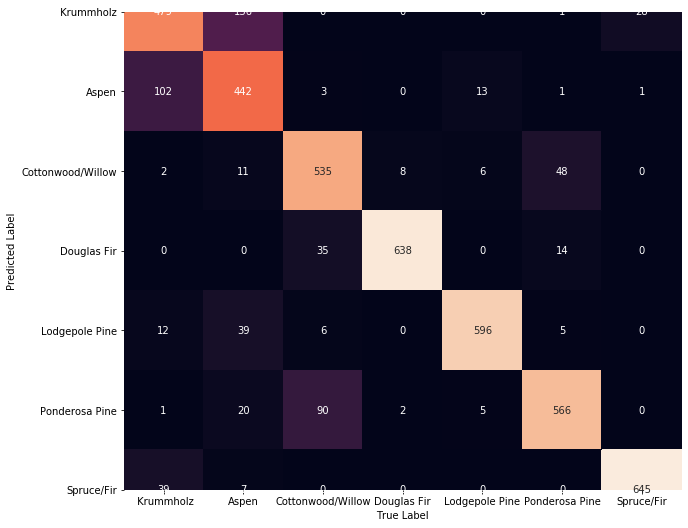

In [65]:
RFClassifier = RandomForestClassifier(n_estimators=300, oob_score = True, max_depth = 50, bootstrap = True, random_state=17)    
report, y_predict , y_valid= ml_pipleline("Random Forest", RFClassifier, X_Orig, y, binarize = False, detailedCVcharts = False )
display_confusion_matrix (y_valid, y_predict)


#### With enhanced features 

Training Set - Classication report metrics: 
                precision    recall  f1-score   support

           1       1.00      1.00      1.00      1525
           2       1.00      1.00      1.00      1505
           3       1.00      1.00      1.00      1491
           4       1.00      1.00      1.00      1512
           5       1.00      1.00      1.00      1540
           6       1.00      1.00      1.00      1525
           7       1.00      1.00      1.00      1486

    accuracy                           1.00     10584
   macro avg       1.00      1.00      1.00     10584
weighted avg       1.00      1.00      1.00     10584

 Random Forest  

Validation Set - Classication report metrics: 
                precision    recall  f1-score   support

           1       0.77      0.79      0.78       635
           2       0.81      0.70      0.75       655
           3       0.91      0.84      0.87       669
           4       0.94      0.99      0.96       648
           5      

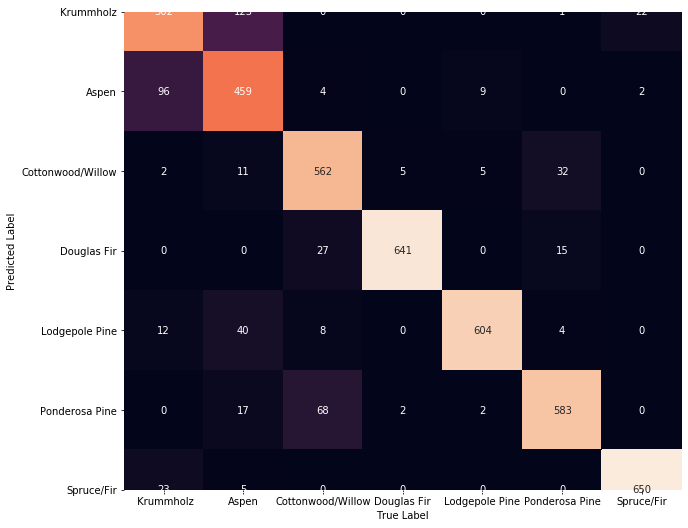

In [66]:
RFClassifier = RandomForestClassifier(n_estimators=300, oob_score = True, max_depth = 50, bootstrap = True, random_state=17)    
report, y_predict , y_valid= ml_pipleline("Random Forest", RFClassifier, X_feature_engineered, y, binarize = False, detailedCVcharts = False )
display_confusion_matrix (y_valid, y_predict)

#### With enhanced features and simplification of our original features [NEEDS RERUN]

In [67]:
# Isolate target data
cover_type = train_new['Cover_Type']
y = np.array(cover_type)

# Dropping output from feature space
# to_drop = ['Cover_Type']
to_drop = ['Cover_Type','Soil_Type1','Soil_Type2','Soil_Type3','Soil_Type4','Soil_Type5','Soil_Type6','Soil_Type7','Soil_Type8',
          'Soil_Type9','Soil_Type10','Soil_Type11','Soil_Type12','Soil_Type13','Soil_Type14','Soil_Type15','Soil_Type16','Soil_Type17',
          'Soil_Type18','Soil_Type19','Soil_Type20','Soil_Type21','Soil_Type22','Soil_Type23','Soil_Type24','Soil_Type25','Soil_Type26',
          'Soil_Type27','Soil_Type28','Soil_Type29','Soil_Type30','Soil_Type31','Soil_Type32','Soil_Type33','Soil_Type34','Soil_Type35','Soil_Type26',
          'Soil_Type36','Soil_Type37','Soil_Type38','Soil_Type39', 'Soil_Type40']



cover_feat_space = train_new.drop(to_drop, axis = 1)

# Pull out geatures for future use
features = cover_feat_space.columns
X = np.array(cover_feat_space).astype(np.float)


X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.3, random_state=17)

scaler = StandardScaler()
scalar = scaler.fit(X_train)
X_std_train = scaler.transform(X_train)
X_std_valid =  scaler.transform(X_valid)

Training Set - Classication report metrics: 
                     precision    recall  f1-score   support

        Krummholz       1.00      1.00      1.00      1032
            Aspen       1.00      1.00      1.00      1078
Cottonwood/Willow       1.00      1.00      1.00      1077
      Douglas Fir       1.00      1.00      1.00      1049
   Lodgepole Pine       1.00      1.00      1.00      1056
   Ponderosa Pine       1.00      1.00      1.00      1054
       Spruce/Fir       1.00      1.00      1.00      1062

         accuracy                           1.00      7408
        macro avg       1.00      1.00      1.00      7408
     weighted avg       1.00      1.00      1.00      7408

 Random Forest  

Validation Set - Classication report metrics: 
                     precision    recall  f1-score   support

        Krummholz       0.94      0.95      0.94       454
            Aspen       0.87      0.95      0.91       462
Cottonwood/Willow       0.92      0.99      0.95       4

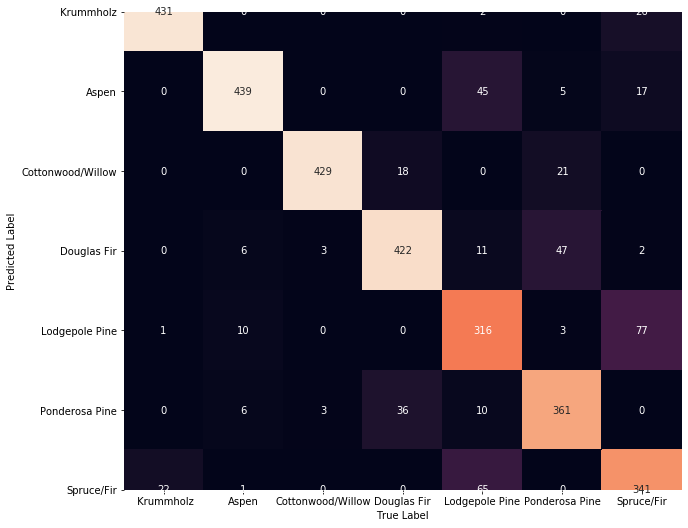

In [68]:
#Soil type categorical
RFClassifier = RandomForestClassifier(n_estimators=300, oob_score = True, max_depth = 50, bootstrap = True, random_state=17)    
report, y_predict , y_valid= ml_pipleline("Random Forest", RFClassifier, X_std_train, y_train, \
                                          binarize = False, detailedCVcharts = False )
display_confusion_matrix (y_valid, y_predict)

## SVM

Implemented GridSearch to find the model with most optimized parameters. 

In [69]:
#svm_parameters = [{'kernel': ['rbf'], 'gamma': [0.00001, 0.001],'C': [1, 5, 10, 50]}] 
             
#clf = GridSearchCV(SVC(), svm_parameters, cv=5, verbose=2)
#clf.fit(X_train, y_train)    
#clf.best_params_
#means=clf.cv_results_['mean_test_score']
#stds=clf.cv_results_['std_test_score']

#print(clf.best_params_)
#print(means)
#print(stds)

The model which produced highest accuracy was then implemented subsequently

#### With our original data 

Training Set - Classication report metrics: 
                     precision    recall  f1-score   support

        Krummholz       0.88      0.81      0.85      1486
            Aspen       0.59      0.66      0.62      1540
Cottonwood/Willow       0.76      0.74      0.75      1512
      Douglas Fir       0.53      0.61      0.57      1525
   Lodgepole Pine       0.51      0.50      0.51      1505
   Ponderosa Pine       0.50      0.41      0.45      1491
       Spruce/Fir       0.55      0.56      0.55      1525

         accuracy                           0.61     10584
        macro avg       0.62      0.61      0.61     10584
     weighted avg       0.62      0.61      0.61     10584

 SVM  

Validation Set - Classication report metrics: 
                     precision    recall  f1-score   support

        Krummholz       0.90      0.82      0.86       674
            Aspen       0.55      0.64      0.59       620
Cottonwood/Willow       0.77      0.75      0.76       648
      D

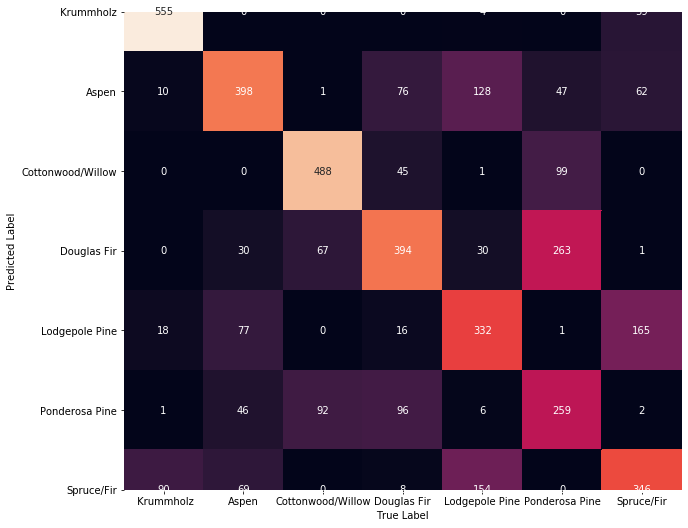

In [70]:
SVMClassifier = SVC(kernel='rbf', gamma = 0.00001, C=10, random_state=17)    
report, y_predict , y_valid= ml_pipleline("SVM", SVMClassifier, X_Orig, y, binarize = False, detailedCVcharts = False )
display_confusion_matrix (y_valid, y_predict)

#### With our enhanced dataset

Training Set - Classication report metrics: 
                     precision    recall  f1-score   support

        Krummholz       0.88      0.81      0.85      1486
            Aspen       0.63      0.64      0.63      1540
Cottonwood/Willow       0.84      0.61      0.71      1512
      Douglas Fir       0.52      0.57      0.54      1525
   Lodgepole Pine       0.45      0.65      0.53      1505
   Ponderosa Pine       0.45      0.53      0.49      1491
       Spruce/Fir       0.59      0.39      0.47      1525

         accuracy                           0.60     10584
        macro avg       0.62      0.60      0.60     10584
     weighted avg       0.62      0.60      0.60     10584

 SVM  

Validation Set - Classication report metrics: 
                     precision    recall  f1-score   support

        Krummholz       0.90      0.82      0.86       674
            Aspen       0.61      0.59      0.60       620
Cottonwood/Willow       0.83      0.64      0.72       648
      D

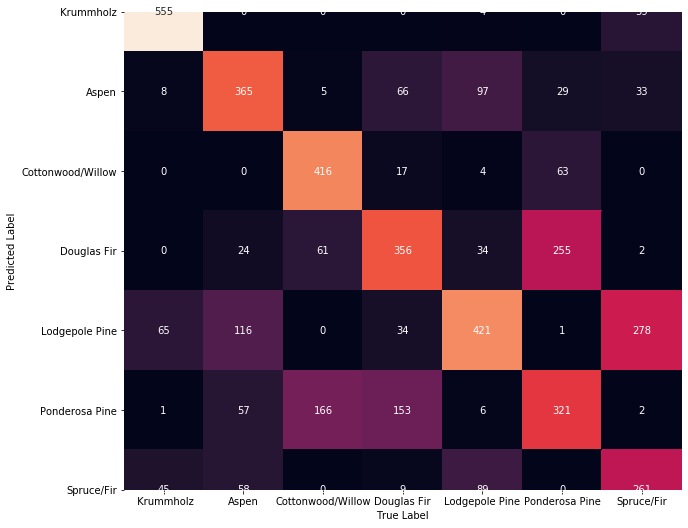

In [71]:
SVMClassifier = SVC(kernel='rbf', gamma = 0.00001, C=10, random_state=17)    
report, y_predict , y_valid= ml_pipleline("SVM", SVMClassifier, X_feature_engineered, y, binarize = False, detailedCVcharts = False )
display_confusion_matrix (y_valid, y_predict)

#### With enhanced features and simplification of our original features [NEEDS RERUN]

In [72]:
# Isolate target data
cover_type = train_new['Cover_Type']
y = np.array(cover_type)

# Dropping output from feature space
# to_drop = ['Cover_Type']
to_drop = ['Cover_Type','Soil_Type1','Soil_Type2','Soil_Type3','Soil_Type4','Soil_Type5','Soil_Type6','Soil_Type7','Soil_Type8',
          'Soil_Type9','Soil_Type10','Soil_Type11','Soil_Type12','Soil_Type13','Soil_Type14','Soil_Type15','Soil_Type16','Soil_Type17',
          'Soil_Type18','Soil_Type19','Soil_Type20','Soil_Type21','Soil_Type22','Soil_Type23','Soil_Type24','Soil_Type25','Soil_Type26',
          'Soil_Type27','Soil_Type28','Soil_Type29','Soil_Type30','Soil_Type31','Soil_Type32','Soil_Type33','Soil_Type34','Soil_Type35','Soil_Type26',
          'Soil_Type36','Soil_Type37','Soil_Type38','Soil_Type39', 'Soil_Type40']



cover_feat_space = train_new.drop(to_drop, axis = 1)

# Pull out geatures for future use
features = cover_feat_space.columns
X = np.array(cover_feat_space).astype(np.float)


X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.3, random_state=17)

scaler = StandardScaler()
scalar = scaler.fit(X_train)
X_std_train = scaler.transform(X_train)
X_std_valid =  scaler.transform(X_valid)

Training Set - Classication report metrics: 
                     precision    recall  f1-score   support

        Krummholz       0.88      0.81      0.84      1032
            Aspen       0.60      0.67      0.63      1078
Cottonwood/Willow       0.83      0.60      0.70      1077
      Douglas Fir       0.52      0.58      0.55      1049
   Lodgepole Pine       0.46      0.57      0.51      1056
   Ponderosa Pine       0.46      0.55      0.50      1054
       Spruce/Fir       0.59      0.41      0.48      1062

         accuracy                           0.60      7408
        macro avg       0.62      0.60      0.60      7408
     weighted avg       0.62      0.60      0.60      7408

 SVM  

Validation Set - Classication report metrics: 
                     precision    recall  f1-score   support

        Krummholz       0.89      0.81      0.85       454
            Aspen       0.56      0.66      0.60       462
Cottonwood/Willow       0.82      0.61      0.70       435
      D

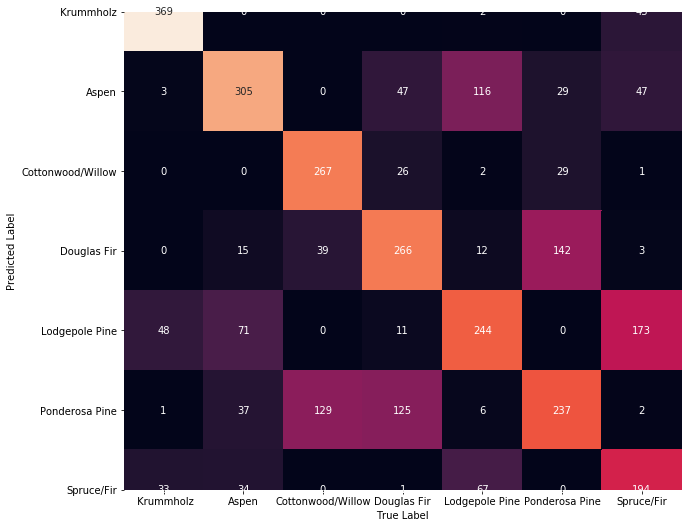

In [73]:
SVMClassifier = SVC(kernel='rbf', gamma = 0.00001, C=10, random_state=17)    
report, y_predict , y_valid= ml_pipleline("SVM", SVMClassifier, X_std_train, y_train, binarize = False, detailedCVcharts = False )
display_confusion_matrix (y_valid, y_predict)

## XGBoost

Several XGBoost iterations led to optimizing hyperparameters. Below, we are showing the XGBoost model with parameters producing the highest accuracy

In [74]:
def perform_xgb(X_train, y_train, X_valid, y_valid, predictors):
    import xgboost as xgb
    xgb0 = XGBClassifier(
        objective= 'multi:softprob',
         learning_rate =0.1,
         n_estimators=1000,
         max_depth=9,
         min_child_weight=1,
         gamma=0,
         subsample=0.8,
         colsample_bytree=0.8,
         nthread=4,
         scale_pos_weight=1,
         seed=27,
         eval_metric = ["merror", "map", "auc"],
         reg_alpha=0.005    
    )
    #     tree_method = "approx", 

    xgb0.fit(X_train, y_train,
             verbose=100,
    #          early_stopping_rounds=3,
             eval_metric=["auc", "mlogloss"]
            )

    y_train_predict = xgb0.predict(X_train)
    train_report = classification_report(y_train, y_train_predict)
    print('Training Set - Classication report metrics: \n ', train_report)

    y_predict = xgb0.predict(X_valid)
    report = classification_report(y_predict, y_valid)
    print('Validation Set - Classication report metrics: \n ', report)
    
    print(" ")
    cv_scores = cross_val_score(xgb0, X, y, cv=cross_validation)
    print('\n Cross Validation Average Score', round(np.mean(cv_scores),3))
    
    print('\n Confusion Matrix:')
    display_confusion_matrix (y_valid, y_predict)
    
    # plot
    plt.figure(figsize=(12,8))
    plt.bar(predictors,xgb0.feature_importances_ )
    plt.title("Feature Importance for XGBoost Prediction", size = 16)
    plt.xticks(predictors, predictors, rotation='vertical')
    plt.show()
    
    return(xgb0, y_predict)

#### With our original data 

In [75]:
X_train, X_valid, y_train, y_valid = train_test_split(
    X_Orig, y, test_size=0.3, random_state=17)

scaler = StandardScaler()
scalar = scaler.fit(X_train)
X_std_train = scaler.transform(X_train)
X_std_valid =  scaler.transform(X_valid)

[12:10:23] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { scale_pos_weight } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


Training Set - Classication report metrics: 
                     precision    recall  f1-score   support

        Krummholz       1.00      1.00      1.00      1486
            Aspen       1.00      1.00      1.00      1540
Cottonwood/Willow       1.00      1.00      1.00      1512
      Douglas Fir       1.00      1.00      1.00      1525
   Lodgepole Pine       1.00      1.00      1.00      1505
   Ponderosa Pine       1.00      1.00      1.00      1491
       Spruce/Fir       1.00      1.00      1.00      1525

         accuracy                           1.00     10584
        macro avg       1.

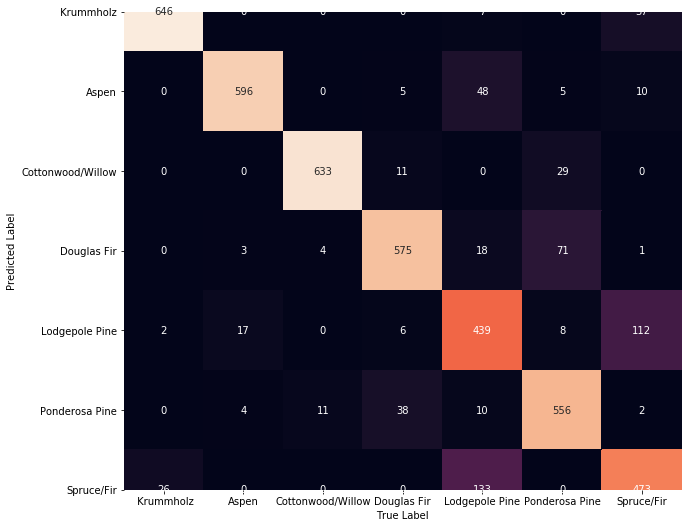

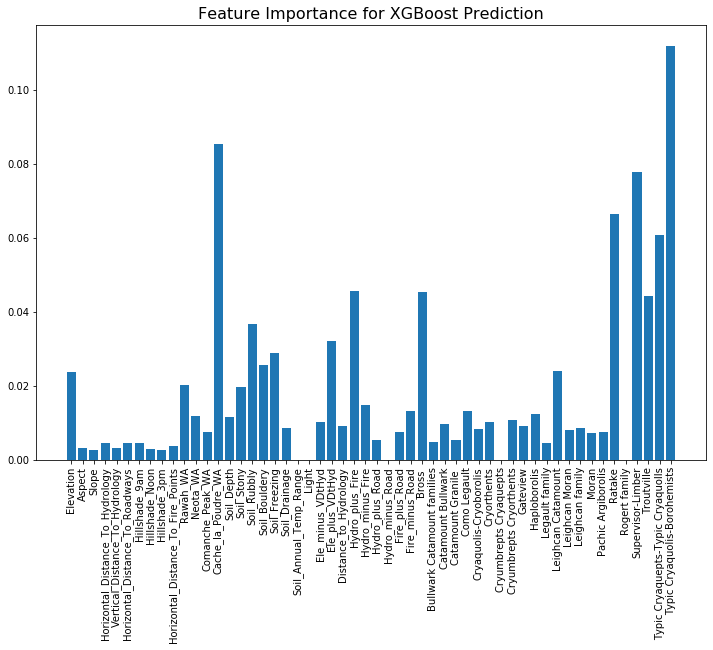

(XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
               colsample_bynode=1, colsample_bytree=0.8,
               eval_metric=['merror', 'map', 'auc'], gamma=0, gpu_id=-1,
               importance_type='gain', interaction_constraints='',
               learning_rate=0.1, max_delta_step=0, max_depth=9,
               min_child_weight=1, missing=nan, monotone_constraints='()',
               n_estimators=1000, n_jobs=4, nthread=4, num_parallel_tree=1,
               objective='multi:softprob', random_state=27, reg_alpha=0.005,
               reg_lambda=1, scale_pos_weight=1, seed=27, subsample=0.8,
               tree_method='exact', validate_parameters=1, verbosity=None),
 array(['Spruce/Fir', 'Cottonwood/Willow', 'Aspen', ..., ' Krummholz',
        ' Krummholz', 'Aspen'], dtype=object))

In [76]:
target = "Cover_Type"
predictors = [x for x in cover_feat_space.columns[0:54] if x not in [target]]
perform_xgb(X_std_train, y_train, X_std_valid, y_valid, predictors)

In [77]:
#display_confusion_matrix (y_valid, y_predict)

In [78]:
# Ploting most relevant features
#target = "Cover_Type"
#predictors = [x for x in train_df.columns[0:54] if x not in [target]]
#plt.figure(figsize=(12,8))
#plt.bar(predictors,xgb0.feature_importances_)
#plt.title("Feature Importance for XGBoost Prediction", size = 16)
#plt.xticks(predictors, predictors, rotation='vertical')
#plt.show()


In [79]:
len(cover_feat_space.columns)

70

#### With our enhanced dataset

In [80]:
X_train, X_valid, y_train, y_valid = train_test_split(
    X_feature_engineered, y, test_size=0.3, random_state=17)

scaler = StandardScaler()
scalar = scaler.fit(X_train)
X_std_train = scaler.transform(X_train)
X_std_valid =  scaler.transform(X_valid)

[12:32:58] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { scale_pos_weight } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


Training Set - Classication report metrics: 
                     precision    recall  f1-score   support

        Krummholz       1.00      1.00      1.00      1486
            Aspen       1.00      1.00      1.00      1540
Cottonwood/Willow       1.00      1.00      1.00      1512
      Douglas Fir       1.00      1.00      1.00      1525
   Lodgepole Pine       1.00      1.00      1.00      1505
   Ponderosa Pine       1.00      1.00      1.00      1491
       Spruce/Fir       1.00      1.00      1.00      1525

         accuracy                           1.00     10584
        macro avg       1.

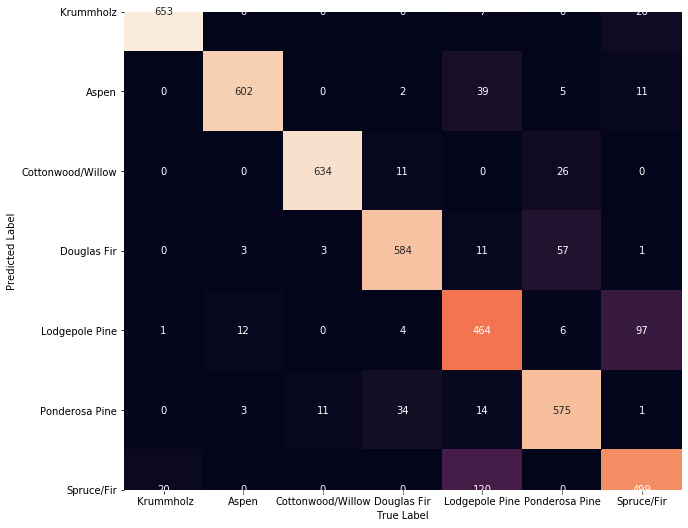

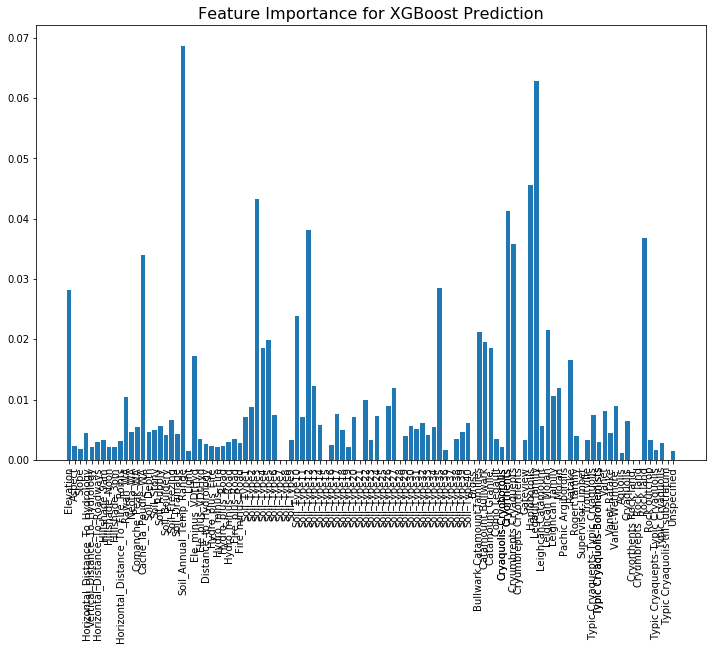

(XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
               colsample_bynode=1, colsample_bytree=0.8,
               eval_metric=['merror', 'map', 'auc'], gamma=0, gpu_id=-1,
               importance_type='gain', interaction_constraints='',
               learning_rate=0.1, max_delta_step=0, max_depth=9,
               min_child_weight=1, missing=nan, monotone_constraints='()',
               n_estimators=1000, n_jobs=4, nthread=4, num_parallel_tree=1,
               objective='multi:softprob', random_state=27, reg_alpha=0.005,
               reg_lambda=1, scale_pos_weight=1, seed=27, subsample=0.8,
               tree_method='exact', validate_parameters=1, verbosity=None),
 array(['Spruce/Fir', 'Cottonwood/Willow', 'Aspen', ..., ' Krummholz',
        ' Krummholz', 'Aspen'], dtype=object))

In [81]:
to_drop = ['Cover_Type']
cover_feat_space = train_new.drop(to_drop, axis = 1)
predictors = [x for x in cover_feat_space.columns if x not in [target]]
perform_xgb(X_std_train, y_train, X_std_valid, y_valid, predictors)

#### With enhanced features and collapsing soil type

In [82]:
# Isolate target data
cover_type = train_new['Cover_Type']
y = np.array(cover_type)

# Dropping output from feature space
# to_drop = ['Cover_Type']
to_drop = ['Cover_Type','Soil_Type1','Soil_Type2','Soil_Type3','Soil_Type4','Soil_Type5','Soil_Type6','Soil_Type7','Soil_Type8',
          'Soil_Type9','Soil_Type10','Soil_Type11','Soil_Type12','Soil_Type13','Soil_Type14','Soil_Type15','Soil_Type16','Soil_Type17',
          'Soil_Type18','Soil_Type19','Soil_Type20','Soil_Type21','Soil_Type22','Soil_Type23','Soil_Type24','Soil_Type25','Soil_Type26',
          'Soil_Type27','Soil_Type28','Soil_Type29','Soil_Type30','Soil_Type31','Soil_Type32','Soil_Type33','Soil_Type34','Soil_Type35','Soil_Type26',
          'Soil_Type36','Soil_Type37','Soil_Type38','Soil_Type39', 'Soil_Type40']



cover_feat_space = train_new.drop(to_drop, axis = 1)

# Pull out geatures for future use
features = cover_feat_space.columns
X = np.array(cover_feat_space).astype(np.float)


X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.3, random_state=17)

scaler = StandardScaler()
scalar = scaler.fit(X_train)
X_std_train = scaler.transform(X_train)
X_std_valid =  scaler.transform(X_valid)

[12:57:25] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { scale_pos_weight } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


Training Set - Classication report metrics: 
                     precision    recall  f1-score   support

        Krummholz       1.00      1.00      1.00      1486
            Aspen       1.00      1.00      1.00      1540
Cottonwood/Willow       1.00      1.00      1.00      1512
      Douglas Fir       1.00      1.00      1.00      1525
   Lodgepole Pine       1.00      1.00      1.00      1505
   Ponderosa Pine       1.00      1.00      1.00      1491
       Spruce/Fir       1.00      1.00      1.00      1525

         accuracy                           1.00     10584
        macro avg       1.

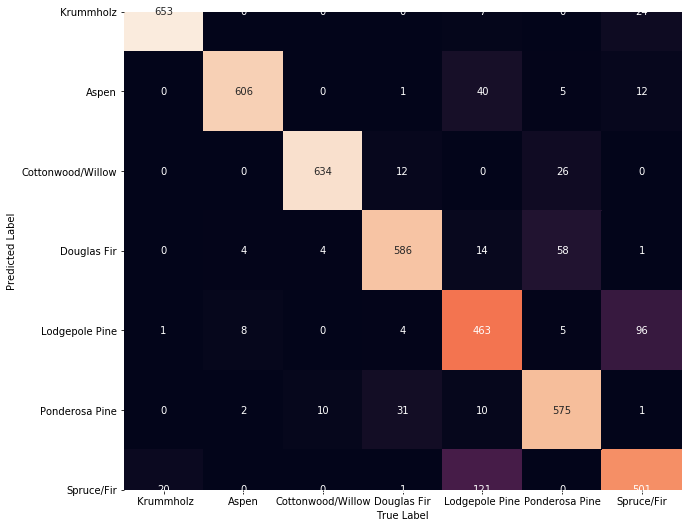

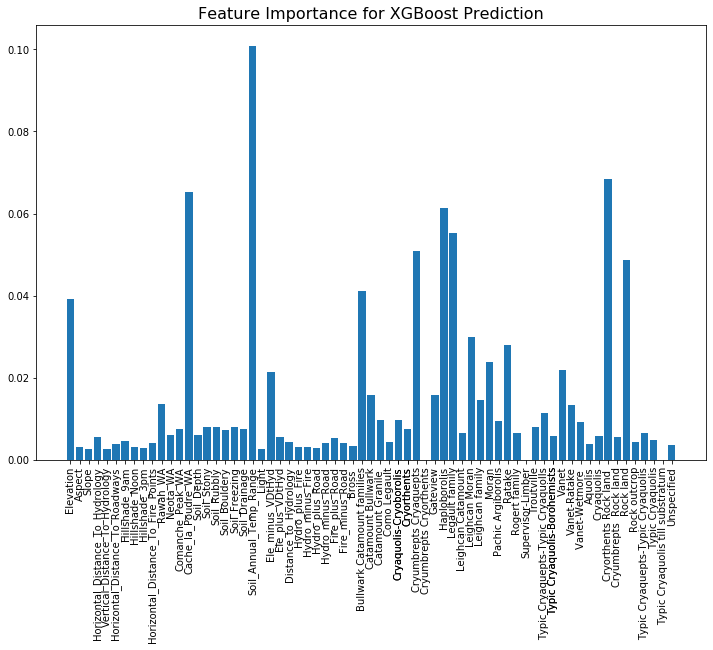

(XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
               colsample_bynode=1, colsample_bytree=0.8,
               eval_metric=['merror', 'map', 'auc'], gamma=0, gpu_id=-1,
               importance_type='gain', interaction_constraints='',
               learning_rate=0.1, max_delta_step=0, max_depth=9,
               min_child_weight=1, missing=nan, monotone_constraints='()',
               n_estimators=1000, n_jobs=4, nthread=4, num_parallel_tree=1,
               objective='multi:softprob', random_state=27, reg_alpha=0.005,
               reg_lambda=1, scale_pos_weight=1, seed=27, subsample=0.8,
               tree_method='exact', validate_parameters=1, verbosity=None),
 array(['Spruce/Fir', 'Cottonwood/Willow', 'Aspen', ..., ' Krummholz',
        ' Krummholz', 'Aspen'], dtype=object))

In [83]:
predictors = [x for x in cover_feat_space.columns if x not in [target]]
xgb_final, y_predict = perform_xgb(X_train, y_train, X_valid, y_valid, predictors)

## Neural networks

Several Neural Network iterations led to optimizing hyperparameters (number of hidden layers, number of nodes in each layer, activation function). Below, we are showing the Neural Network model with parameters producing the highest accuracy.

In [84]:
def NeuralNetworks(dims=X_std_train.shape[1]):
    model = Sequential() 
    model.add(Dense(units=50, input_dim=dims, activation='relu')) 
    model.add(Dense(units=7, input_dim=50, activation='softmax')) 

    ## Cost function & Objective (and solver)
    sgd = optimizers.SGD(lr=0.01)
    model.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy'])
    history = model.fit(X_std_train, y_train, shuffle=True, batch_size=10,verbose=0, epochs=100) 
    score = model.evaluate(X_std_valid, y_valid, verbose=0) 
    print('Validation set accuracy:', score[1])

#### With our original data

In [85]:
label_classes = [1,2,3,4,5,6,7]
y_binarized = label_binarize(y, classes=[1,2,3,4,5,6,7])


X_train, X_valid, y_train, y_valid = train_test_split(
    X_Orig, y_binarized, test_size=0.3, random_state=17)


scaler = StandardScaler()
scalar = scaler.fit(X_train)
X_std_train = scaler.transform(X_train)
X_std_valid =  scaler.transform(X_valid)

In [86]:
# model = Sequential() 
# model.add(Dense(units=50, input_dim=X_std_train.shape[1], activation='relu')) 
# model.add(Dense(units=7, input_dim=50, activation='softmax')) 

# ## Cost function & Objective (and solver)
# sgd = optimizers.SGD(lr=0.01)
# model.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy'])
# history = model.fit(X_std_train, y_train, shuffle=True, batch_size=10,verbose=0, epochs=6) 
# score = model.evaluate(X_std_valid, y_valid, verbose=0) 
# print('Validation set accuracy:', score[1])

Validation set accuracy: 0.0


In [87]:
model = Sequential() 
model.add(Dense(units=50, input_dim=X_std_train.shape[1], activation='relu')) 
model.add(Dense(units=7, input_dim=50, activation='softmax')) 

## Cost function & Objective (and solver)
sgd = optimizers.SGD(lr=0.01)
model.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit(X_std_train, y_train, shuffle=True, batch_size=10,verbose=0, epochs=12) 
score = model.evaluate(X_std_valid, y_valid, verbose=0) 
print('Validation set accuracy:', score[1])

Validation set accuracy: 1.0


In [88]:
# def NeuralNetworks(dims=X_std_train.shape[1]):
#     model = Sequential() 
#     model.add(Dense(units=50, input_dim=dims, activation='relu')) 
#     model.add(Dense(units=7, input_dim=50, activation='softmax')) 

#     ## Cost function & Objective (and solver)
#     sgd = optimizers.SGD(lr=0.01)
#     model.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy'])
#     history = model.fit(X_std_train, y_train, shuffle=True, batch_size=10,verbose=0, epochs=20) 
#     score = model.evaluate(X_std_valid, y_valid, verbose=0) 
#     print('Validation set accuracy:', score[1])

In [89]:
# def NeuralNetworks(dims=X_std_train.shape[1]):
#     model = Sequential() 
#     model.add(Dense(units=50, input_dim=dims, activation='relu')) 
#     model.add(Dense(units=7, input_dim=50, activation='softmax')) 

#     ## Cost function & Objective (and solver)
#     sgd = optimizers.SGD(lr=0.01)
#     model.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy'])
#     history = model.fit(X_std_train, y_train, shuffle=True, batch_size=10,verbose=0, epochs=50) 
#     score = model.evaluate(X_std_valid, y_valid, verbose=0) 
#     print('Validation set accuracy:', score[1])

In [90]:
# NeuralNetworks(dims=X_std_train.shape[1])

Validation set accuracy: 1.0


#### With our enhanced dataset

In [91]:
label_classes = [1,2,3,4,5,6,7]
y_binarized = label_binarize(y, classes=[1,2,3,4,5,6,7])


X_train, X_valid, y_train, y_valid = train_test_split(
    X_feature_engineered, y_binarized, test_size=0.3, random_state=17)


scaler = StandardScaler()
scalar = scaler.fit(X_train)
X_std_train = scaler.transform(X_train)
X_std_valid =  scaler.transform(X_valid)

In [92]:
NeuralNetworks(dims=X_std_train.shape[1])

Validation set accuracy: 1.0


#### With enhanced features and collapsing soil type

In [93]:
# Isolate target data
cover_type = train_new['Cover_Type']
y = np.array(cover_type)

# Dropping output from feature space
# to_drop = ['Cover_Type']
to_drop = ['Cover_Type','Soil_Type1','Soil_Type2','Soil_Type3','Soil_Type4','Soil_Type5','Soil_Type6','Soil_Type7','Soil_Type8',
          'Soil_Type9','Soil_Type10','Soil_Type11','Soil_Type12','Soil_Type13','Soil_Type14','Soil_Type15','Soil_Type16','Soil_Type17',
          'Soil_Type18','Soil_Type19','Soil_Type20','Soil_Type21','Soil_Type22','Soil_Type23','Soil_Type24','Soil_Type25','Soil_Type26',
          'Soil_Type27','Soil_Type28','Soil_Type29','Soil_Type30','Soil_Type31','Soil_Type32','Soil_Type33','Soil_Type34','Soil_Type35','Soil_Type26',
          'Soil_Type36','Soil_Type37','Soil_Type38','Soil_Type39', 'Soil_Type40']



cover_feat_space = train_new.drop(to_drop, axis = 1)

# Pull out geatures for future use
features = cover_feat_space.columns
X = np.array(cover_feat_space).astype(np.float)


X_train, X_valid, y_train, y_valid = train_test_split(
    X, y_binarized, test_size=0.3, random_state=17)

scaler = StandardScaler()
scalar = scaler.fit(X_train)
X_std_train = scaler.transform(X_train)
X_std_valid =  scaler.transform(X_valid)

In [94]:
NeuralNetworks(dims=X_std_train.shape[1])

Validation set accuracy: 1.0


### Ensemble Model - Stacking

We sought to understand the effect of a meta-learning algorith, such as Stacking Ensemble Machine Learning, and see if we could improve our accuracy by combining well performing models. 

#### Using our enhanced dataset, collapsing soil type

In [95]:
# Isolate target data
cover_type = train_new['Cover_Type']
y = np.array(cover_type)

# Dropping output from feature space
# to_drop = ['Cover_Type']
to_drop = ['Cover_Type','Soil_Type1','Soil_Type2','Soil_Type3','Soil_Type4','Soil_Type5','Soil_Type6','Soil_Type7','Soil_Type8',
          'Soil_Type9','Soil_Type10','Soil_Type11','Soil_Type12','Soil_Type13','Soil_Type14','Soil_Type15','Soil_Type16','Soil_Type17',
          'Soil_Type18','Soil_Type19','Soil_Type20','Soil_Type21','Soil_Type22','Soil_Type23','Soil_Type24','Soil_Type25','Soil_Type26',
          'Soil_Type27','Soil_Type28','Soil_Type29','Soil_Type30','Soil_Type31','Soil_Type32','Soil_Type33','Soil_Type34','Soil_Type35','Soil_Type26',
          'Soil_Type36','Soil_Type37','Soil_Type38','Soil_Type39', 'Soil_Type40']



cover_feat_space = train_new.drop(to_drop, axis = 1)

# Pull out geatures for future use
features = cover_feat_space.columns
X = np.array(cover_feat_space).astype(np.float)


X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.3, random_state=17)

scaler = StandardScaler()
scalar = scaler.fit(X_train)
X_std_train = scaler.transform(X_train)
X_std_valid =  scaler.transform(X_valid)

In [96]:
estimators = [
    ('knn', KNeighborsClassifier(n_neighbors=1)),
    ('rf', RandomForestClassifier(n_estimators=1000, max_depth =100, bootstrap = True, random_state=17)),
    ('svm', SVC(kernel='rbf', gamma = 0.00001, C=10, random_state=17))
]

clf = StackingClassifier(estimators=estimators, final_estimator=XGBClassifier(
    objective= 'multi:softprob',
     learning_rate =0.2,
     n_estimators=1000,
     max_depth=9,
     min_child_weight=1,
     gamma=0,
     subsample=0.8,
     colsample_bytree=0.6,
     nthread=4,
     scale_pos_weight=1,
     seed=27,
     eval_metric = ["merror", "map", "auc"],
     reg_alpha=0.005    
))

print(clf.fit(X_std_train, y_train).score(X_std_valid, y_valid))
print(" ")


cv_scores = cross_val_score(clf, X_std_train, y_train, cv=5)
print('\n Cross Validation Average Score', np.mean(cv_scores))

[13:26:23] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { scale_pos_weight } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


0.8805114638447972
 
[13:31:02] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { scale_pos_weight } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:35:05] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { scale_pos_weight } might not be used.

  This may not be accurate due to so

### Best Model and Results

In [ ]:

# Dropping output from feature space
# to_drop = ['Cover_Type']
to_drop = ['Cover_Type','Soil_Type1','Soil_Type2','Soil_Type3','Soil_Type4','Soil_Type5','Soil_Type6','Soil_Type7','Soil_Type8',
          'Soil_Type9','Soil_Type10','Soil_Type11','Soil_Type12','Soil_Type13','Soil_Type14','Soil_Type15','Soil_Type16','Soil_Type17',
          'Soil_Type18','Soil_Type19','Soil_Type20','Soil_Type21','Soil_Type22','Soil_Type23','Soil_Type24','Soil_Type25','Soil_Type26',
          'Soil_Type27','Soil_Type28','Soil_Type29','Soil_Type30','Soil_Type31','Soil_Type32','Soil_Type33','Soil_Type34','Soil_Type35','Soil_Type26',
          'Soil_Type36','Soil_Type37','Soil_Type38','Soil_Type39', 'Soil_Type40']



cover_feat_space = train_new.drop(to_drop, axis = 1)

# Pull out geatures for future use
features = cover_feat_space.columns
X = np.array(cover_feat_space).astype(np.float)


label_classes = [1,2,3,4,5,6,7]
y_binarized = label_binarize(y, classes=[1,2,3,4,5,6,7])
# encoder = preprocessing.LabelEncoder()

X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.3, random_state=17)

predictors = [x for x in cover_feat_space.columns if x not in [target]]
xgb, y_predict = perform_xgb(X_train, y_train, X_valid, y_valid, predictors)

[13:51:25] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { scale_pos_weight } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


Training Set - Classication report metrics: 
                     precision    recall  f1-score   support

        Krummholz       1.00      1.00      1.00      1486
            Aspen       1.00      1.00      1.00      1540
Cottonwood/Willow       1.00      1.00      1.00      1512
      Douglas Fir       1.00      1.00      1.00      1525
   Lodgepole Pine       1.00      1.00      1.00      1505
   Ponderosa Pine       1.00      1.00      1.00      1491
       Spruce/Fir       1.00      1.00      1.00      1525

         accuracy                           1.00     10584
        macro avg       1.

### Evaluating Model with Test Data

In [ ]:

test_df = pd.read_csv('input/test.csv', index_col='Id')
test_df= add_soil_type(test_df)
test_df= add_soil_family(test_df)
test_df= add_Soil_Complex(test_df)
test_df= add_Soil_depth(test_df)
test_df= add_Soil_Stony(test_df)
test_df= add_Soil_Rubbly(test_df)
test_df= add_Soil_Bouldery(test_df)
test_df= add_Soil_Freezing(test_df)
test_df= add_Soil_Drainage(test_df)
test_df= add_Soil_Annual_Temp_Range(test_df)
test_df = add_light(test_df)
test_df = rename_wilderness_area(test_df)
test_df= add_more_features(test_df)
test_new = prepare_for_ML_Program(test_df, test=True)
# test_new.columns

# Feature 'Gothic' is not available in Train data
to_drop = ['Soil_Type1','Soil_Type2','Soil_Type3','Soil_Type4','Soil_Type5','Soil_Type6','Soil_Type7','Soil_Type8',
          'Soil_Type9','Soil_Type10','Soil_Type11','Soil_Type12','Soil_Type13','Soil_Type14','Soil_Type15','Soil_Type16','Soil_Type17',
          'Soil_Type18','Soil_Type19','Soil_Type20','Soil_Type21','Soil_Type22','Soil_Type23','Soil_Type24','Soil_Type25','Soil_Type26',
          'Soil_Type27','Soil_Type28','Soil_Type29','Soil_Type30','Soil_Type31','Soil_Type32','Soil_Type33','Soil_Type34','Soil_Type35','Soil_Type26',
          'Soil_Type36','Soil_Type37','Soil_Type38','Soil_Type39', 'Soil_Type40', 'Gothic']



cover_feat_space = test_new.drop(to_drop, axis = 1)



# # Pull out features for future use
features = cover_feat_space.columns
# list(features)
X_test = np.array(cover_feat_space).astype(np.float)

y_test_predict  = xgb.predict(X_test)


In [ ]:
X_ids = pd.DataFrame(test_df.index, columns =['Id'])
# Results
cover_types_dict = {1:'Spruce/Fir', 2: 'Lodgepole Pine', 3: 'Ponderosa Pine', 4: 'Cottonwood/Willow', 5: 'Aspen', 6: 'Douglas Fir', 7: ' Krummholz'}
y_test_labels = pd.DataFrame([cover_types_dict[value] for value in y_test_predict], columns =['cover_type'])
results = pd.concat([X_ids,y_test_labels], axis=1 )   

fig, ax = plt.subplots(figsize=(10,5))
ax.set_title("Distribution of the Various Cover Types - Test Data", size = 14)
ax.set_xticklabels(ax.get_xticklabels(),rotation=30)
ax = sns.countplot(x = "cover_type", data = results)


In [ ]:
y_test_results = pd.DataFrame(y_test_predict,columns=['cover_type'])
final_results = pd.concat([X_ids,y_test_results], axis=1 )
final_results.to_csv('TestResults.csv')
